<a href="https://colab.research.google.com/github/aripins/Digital-Image/blob/main/TEKNIK_KEAMANAN_CITRA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**KRIPTOGRAFI**

In [1]:
!pip install pycryptodome

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 7.9 MB/s eta 0:00:00


In [2]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from google.colab import files

Upload gambar untuk enkripsi:


Saving harpot.jpeg to harpot (1).jpeg
Gambar asli:


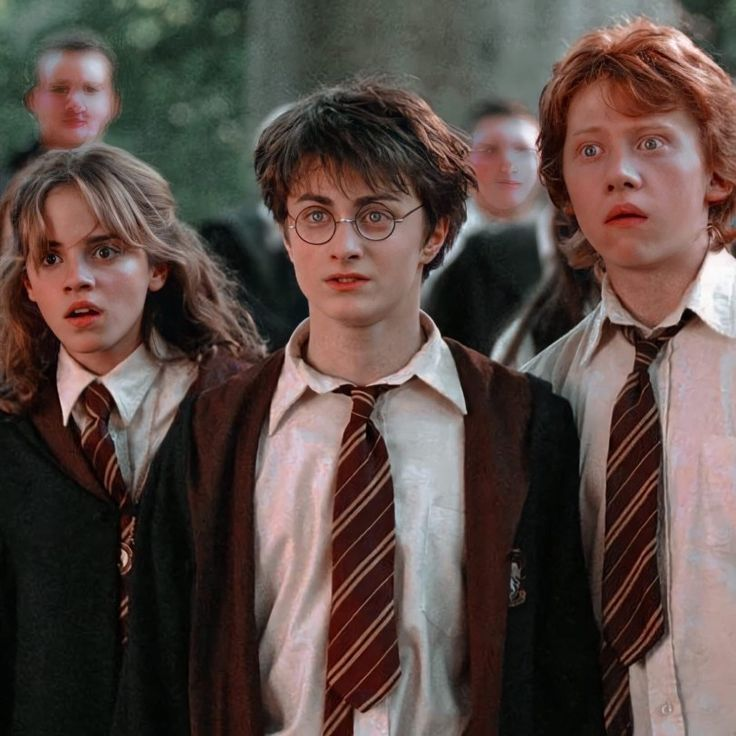

In [3]:
# Fungsi untuk mengenkripsi gambar menggunakan XOR
def xor_encrypt_decrypt(image, key):
    # Membuat kunci yang seukuran dengan gambar
    key_matrix = np.full(image.shape, key, dtype=np.uint8)
    # Menggunakan XOR untuk enkripsi/dekripsi
    encrypted_image = cv2.bitwise_xor(image, key_matrix)
    return encrypted_image

# Upload gambar untuk enkripsi
print("Upload gambar untuk enkripsi:")
uploaded_image = files.upload()
image_path = list(uploaded_image.keys())[0]
image = cv2.imread(image_path)

# Tampilkan gambar asli
print("Gambar asli:")
cv2_imshow(image)

In [7]:
# Tentukan kunci enkripsi (bisa angka atau byte lain)
key = 87654321  # Kunci enkripsi sederhana, bisa mengganti nilai ini

Gambar setelah dienkripsi:


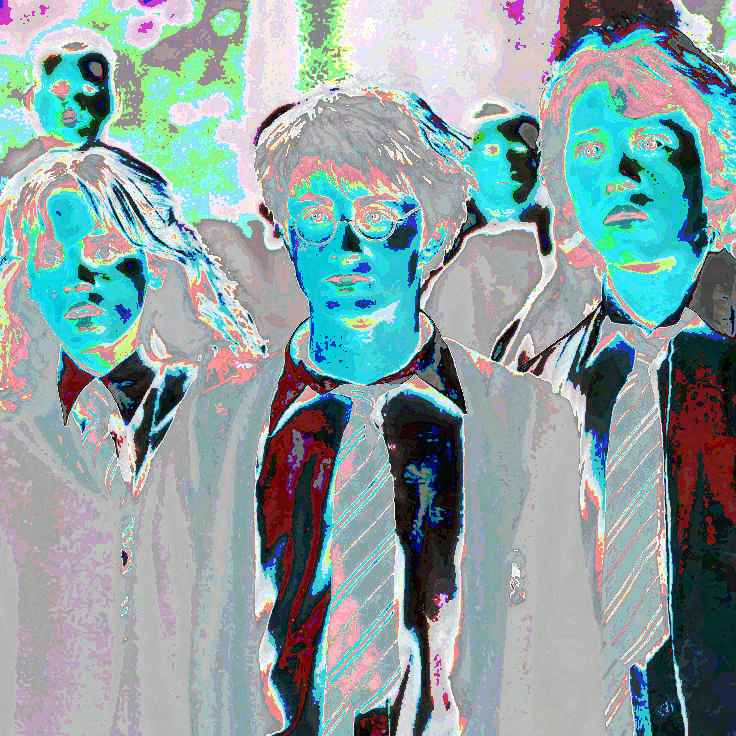

Gambar yang sudah dienkripsi disimpan sebagai encrypted_image.png


In [8]:
# Enkripsi gambar
encrypted_image = xor_encrypt_decrypt(image, key)

# Tampilkan gambar yang sudah dienkripsi
print("Gambar setelah dienkripsi:")
cv2_imshow(encrypted_image)

# Simpan gambar hasil enkripsi
encrypted_image_path = "encrypted_image.png"
cv2.imwrite(encrypted_image_path, encrypted_image)
print(f"Gambar yang sudah dienkripsi disimpan sebagai {encrypted_image_path}")

Gambar setelah didekripsi:


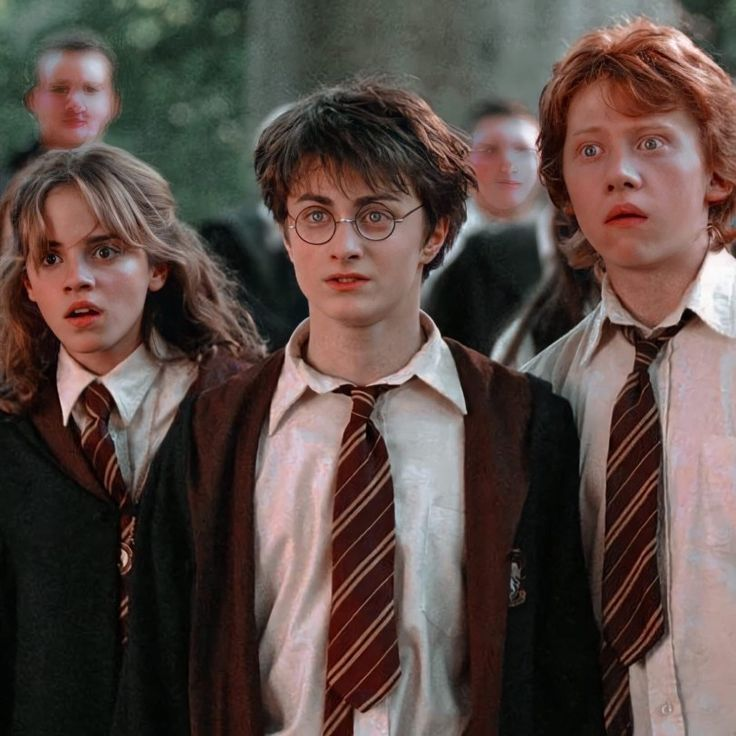

In [9]:
# Dekripsi gambar menggunakan kunci yang sama
decrypted_image = xor_encrypt_decrypt(encrypted_image, key)

# Tampilkan gambar hasil dekripsi (untuk memverifikasi)
print("Gambar setelah didekripsi:")
cv2_imshow(decrypted_image)


**STEGANOGRAFI**

In [10]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from google.colab import files

In [11]:
# Fungsi untuk menyisipkan pesan (encoding)
def lsb_encode(cover_image, secret_message):
    # Konversi pesan menjadi bit
    message_bits = ''.join(format(ord(char), '08b') for char in secret_message) + '00000000'
    encoded_image = cover_image.copy()
    data_index = 0

    for row in encoded_image:
        for pixel in row:
            for channel in range(3):  # Iterasi tiap channel warna (B, G, R)
                if data_index < len(message_bits):
                    pixel[channel] = (pixel[channel] & ~1) | int(message_bits[data_index])
                    data_index += 1
                else:
                    break

    return encoded_image

In [12]:
# Fungsi untuk mengekstraksi pesan (decoding)
def lsb_decode(encoded_image):
    message_bits = []
    for row in encoded_image:
        for pixel in row:
            for channel in range(3):  # Iterasi tiap channel warna (B, G, R)
                message_bits.append(pixel[channel] & 1)

    # Mengonversi bit ke teks
    message_bytes = [message_bits[i:i + 8] for i in range(0, len(message_bits), 8)]
    secret_message = ''.join(chr(int(''.join(map(str, byte)), 2)) for byte in message_bytes)

    # Menghapus padding null karakter
    return secret_message.split('\x00', 1)[0]

Upload gambar cover:


Saving harpot.jpeg to harpot (2).jpeg
Gambar Cover:


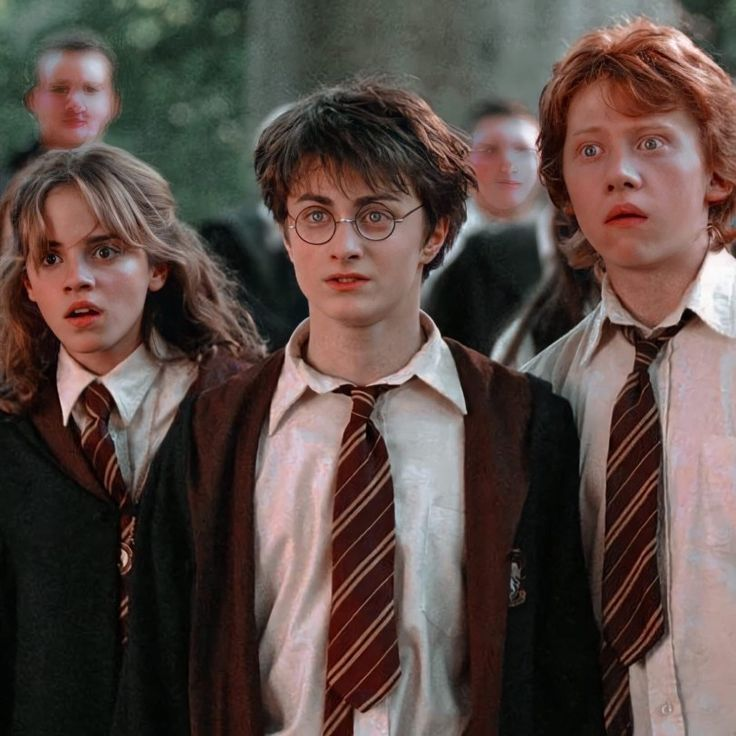

In [13]:
# Upload gambar cover
print("Upload gambar cover:")
uploaded_cover = files.upload()
cover_path = list(uploaded_cover.keys())[0]
cover_image = cv2.imread(cover_path)

# Tampilkan gambar cover
print("Gambar Cover:")
cv2_imshow(cover_image)

In [14]:
# Input pesan rahasia
secret_message = input("Masukkan pesan rahasia:  My Hogwarts dorm is in Ravenclaw, what about you?")

Masukkan pesan rahasia:  My Hogwarts dorm is in Ravenclaw, what about you?mine is slytherin


Proses encoding selesai!
Gambar dengan pesan rahasia:


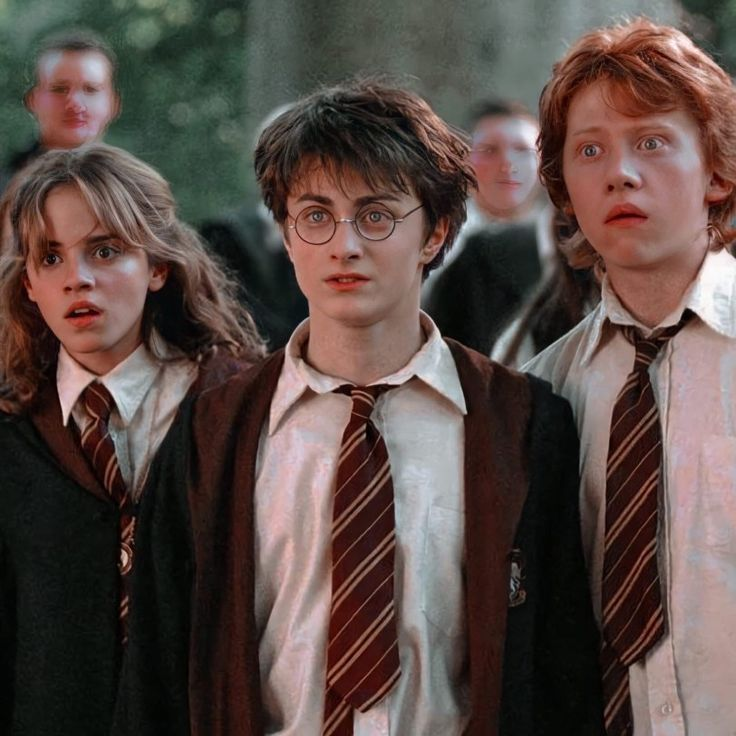

In [15]:
# Proses encoding
encoded_image = lsb_encode(cover_image, secret_message)
print("Proses encoding selesai!")
print("Gambar dengan pesan rahasia:")
cv2_imshow(encoded_image)

In [16]:
# Simpan gambar hasil encoding
encoded_path = "encoded_image.png"
cv2.imwrite(encoded_path, encoded_image)
print(f"Gambar hasil encoding disimpan sebagai {encoded_path}")

Gambar hasil encoding disimpan sebagai encoded_image.png


In [17]:
# Proses decoding
decoded_message = lsb_decode(encoded_image)
print(f"Pesan rahasia yang disisipkan: {decoded_message}")

Pesan rahasia yang disisipkan: mine is slytherin


**DIGITAL** **WATERMARKING**

Silakan unggah gambar untuk diproses:


Saving harpot.jpeg to harpot (5).jpeg
Menampilkan gambar asli:


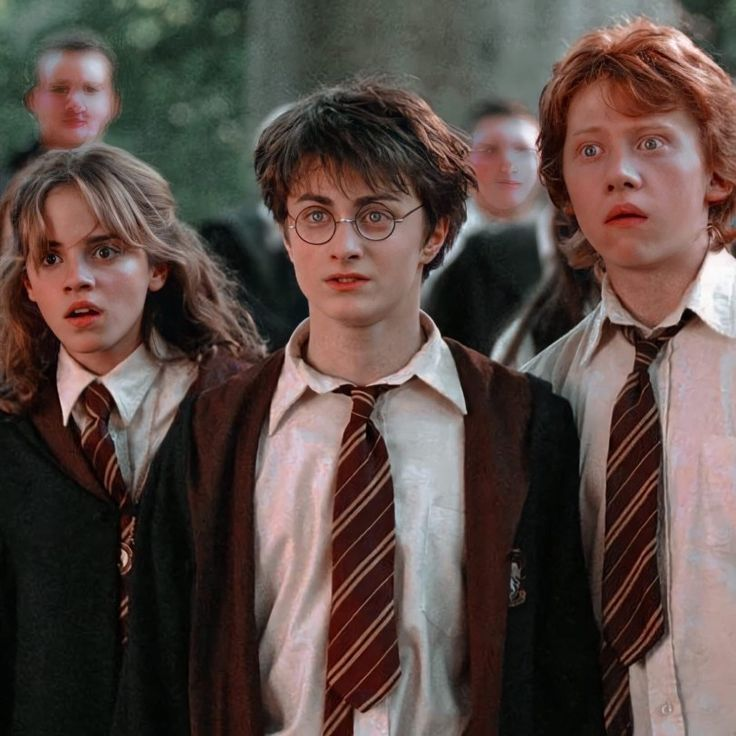

Gambar dengan watermark teks:


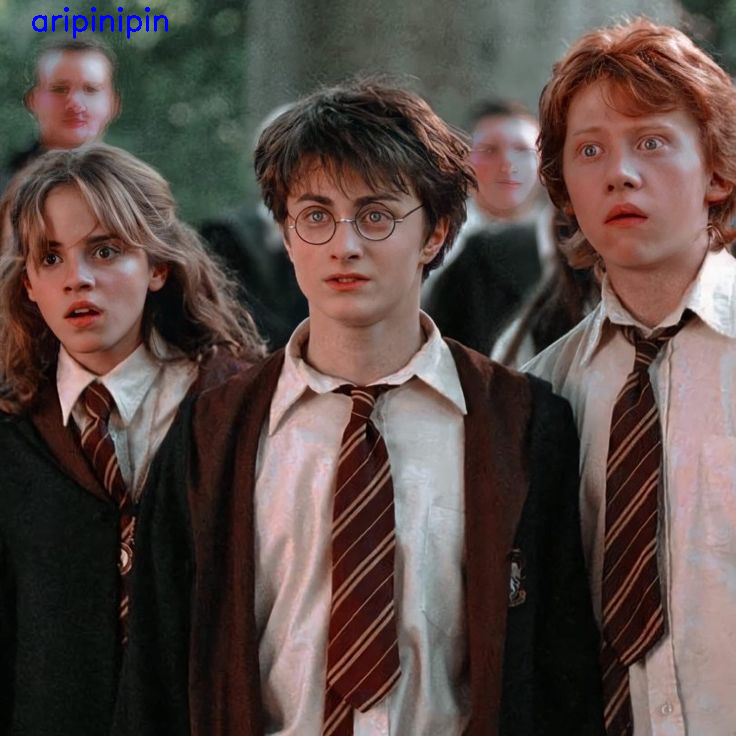

Gambar terenkripsi:


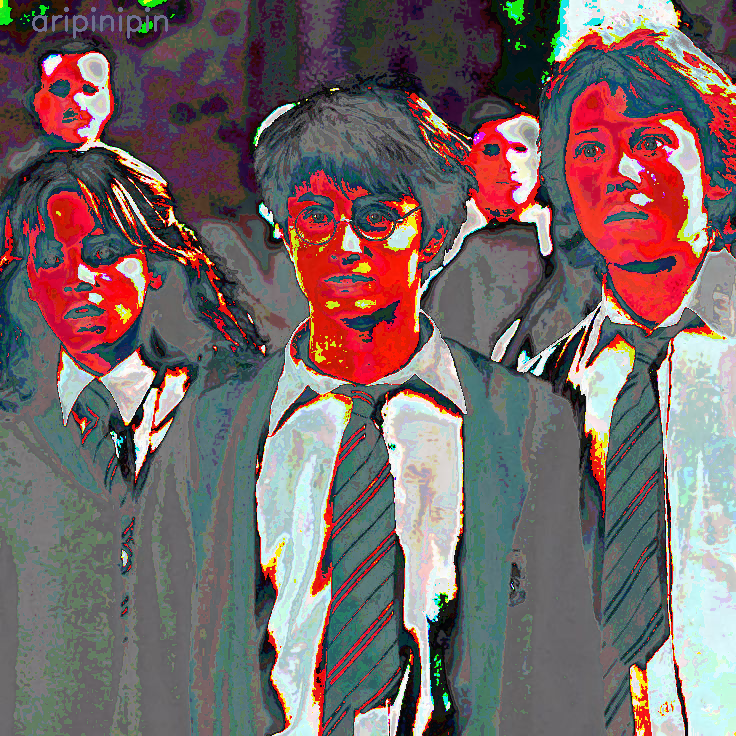

Gambar setelah didekripsi:


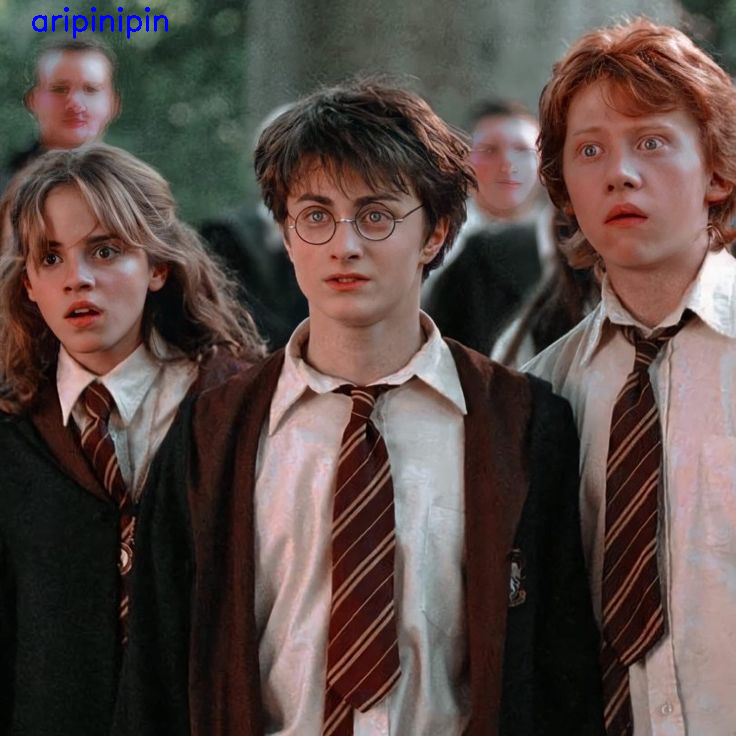

Semua gambar telah berhasil disimpan.


In [4]:
!pip install pycryptodome

import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from google.colab import files

# Fungsi untuk mengenkripsi atau mendekripsi gambar menggunakan operasi XOR
def xor_cipher(img, key_value):
    key_matrix = np.full(img.shape, key_value, dtype=np.uint8)
    processed_img = cv2.bitwise_xor(img, key_matrix)
    return processed_img

# Fungsi untuk menambahkan teks watermark ke dalam gambar
def apply_text_watermark(img, watermark_text="Secured", pos=(30, 30), font_style=cv2.FONT_HERSHEY_SIMPLEX, font_size=1, color_code=(255, 0, 0), thickness=2):
    img_copy = img.copy()
    cv2.putText(img_copy, watermark_text, pos, font_style, font_size, color_code, thickness)
    return img_copy

# Fungsi untuk menempelkan gambar watermark ke dalam gambar utama
def apply_image_watermark(base_img, watermark_img_path, pos=(10, 10)):
    watermark_img = cv2.imread(watermark_img_path, cv2.IMREAD_UNCHANGED)
    overlay_img = base_img.copy()

    # Ubah ukuran watermark jika terlalu besar
    (h, w) = watermark_img.shape[:2]
    scale_ratio = min(base_img.shape[1] / w, base_img.shape[0] / h, 0.2)
    resized_watermark = cv2.resize(watermark_img, (int(w * scale_ratio), int(h * scale_ratio)))

    # Tempelkan watermark pada posisi tertentu
    x, y = pos
    overlay_img[y:y+resized_watermark.shape[0], x:x+resized_watermark.shape[1]] = resized_watermark
    return overlay_img

# Proses upload gambar
print("Silakan unggah gambar untuk diproses:")
uploaded_files = files.upload()
img_file_path = list(uploaded_files.keys())[0]
input_img = cv2.imread(img_file_path)

# Menampilkan gambar yang diunggah
print("Menampilkan gambar asli:")
cv2_imshow(input_img)

# Menambahkan watermark teks pada gambar
watermarked_img = apply_text_watermark(input_img, watermark_text="aripinipin")
print("Gambar dengan watermark teks:")
cv2_imshow(watermarked_img)

# Proses enkripsi gambar menggunakan kunci
encryption_key = 111
encrypted_img = xor_cipher(watermarked_img, encryption_key)
print("Gambar terenkripsi:")
cv2_imshow(encrypted_img)

# Proses dekripsi gambar
decrypted_img = xor_cipher(encrypted_img, encryption_key)
print("Gambar setelah didekripsi:")
cv2_imshow(decrypted_img)

# Menyimpan semua hasil ke file
cv2.imwrite("original_uploaded_image.jpg", input_img)
cv2.imwrite("text_watermarked_image.jpg", watermarked_img)
cv2.imwrite("xor_encrypted_image.jpg", encrypted_img)
cv2.imwrite("xor_decrypted_image.jpg", decrypted_img)
print("Semua gambar telah berhasil disimpan.")
